# Training file for UpscaleNN

## Imports

In [1]:
import platform 


device = None
if platform.system() == 'Windows':  # Check if the OS is Windows
    import torch_directml  # Import torch_directml only on Windows
    device = torch_directml.device()
else:
    !pip install -r requirements.txt
    pass


2023-12-08 17:51:03.155049: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-08 17:51:03.155079: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-08 17:51:03.155099: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-12-08 17:51:03.160101: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


cuda


In [ ]:

import src.nntools as nt
from src.CarlaDataset import CarlaDatasetPatch
from src.PytorchUtil import PytorchUtil as torchUtil
from src.PlotUtils import PlotUtils

from src.UpscaleNN import UpscaleNN
import numpy as np
import torch
import torch.nn.functional as F
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import skimage.metrics as metrics
# Import the platform module to detect the OS

if not device:
    if torch.cuda.is_available():
        device = torch.device('cuda')
        torch.cuda.empty_cache()
    else:
        device = torch.device('cpu')

print(device)

# Utility function

In [2]:
class SuperResolutionStatsManager(nt.StatsManager):
    def __init__(self):
        super(SuperResolutionStatsManager, self).__init__()

    def init(self):
        super(SuperResolutionStatsManager, self).init()
        # Initializing `self.running_psnr`
        self.running_psnr = 0
        self.running_ssim = 0

    def accumulate(self, loss, x, y, d):
        super(SuperResolutionStatsManager, self).accumulate(loss, x, y, d)
        # Updating `self.running_psnr`
        d_numpy = d.detach().to('cpu').numpy()
        y_numpy = y.detach().to('cpu').numpy()

        self.running_psnr += metrics.peak_signal_noise_ratio(d_numpy, y_numpy)

        current_ssim = 0

        for i in range(d_numpy.shape[0]):
            d_numpy_temp = np.moveaxis(d_numpy[i], [0, 1, 2], [2, 0, 1])
            y_numpy_temp = np.moveaxis(y_numpy[i], [0, 1, 2], [2, 0, 1])

            value_range = max(d_numpy_temp.max(), y_numpy_temp.max()) - min(d_numpy_temp.min(), y_numpy_temp.min())
            
            current_ssim += metrics.structural_similarity(d_numpy_temp, y_numpy_temp, win_size=7, data_range=value_range, multichannel=True, channel_axis=2)
        
        self.running_ssim += current_ssim / d_numpy.shape[0]

    def summarize(self):
        loss = super(SuperResolutionStatsManager, self).summarize()
        psnr = self.running_psnr / (self.number_update+1e-9 )
        ssim = self.running_ssim / (self.number_update+1e-9 )

        return {'loss': loss, 'psnr': psnr, "ssim": ssim}

def criterion(y, d, lpips, lpips_lambda):
    return F.mse_loss(y, d) + lpips(y, d)*lpips_lambda

## Data loader

In [3]:
new_img_size = 256
common_transform = transforms.Compose([
    #transforms.RandomHorizontalFlip(),
    #transforms.RandomVerticalFlip(),
    transforms.ToTensor(),
])

train_transform = transforms.Compose([
    common_transform,
    #transforms.RandomRotation(degrees=10),
    #transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.2),
    #transforms.RandomResizedCrop(size=(new_img_size, new_img_size), scale=(0.8, 1.0), ratio=(0.75, 1.333)),
])

valid_transform = transforms.Compose([
    common_transform,
    #transforms.CenterCrop((new_img_size, new_img_size)),
])

In [4]:
PATCH_SIZE = 32

full_train_dataset = CarlaDatasetPatch("1920x1080", "960x540", "train", transforms=train_transform, download=True, patch_size=PATCH_SIZE)
full_test_dataset = CarlaDatasetPatch("1920x1080", "960x540", "test", transforms=train_transform, download=True, patch_size=PATCH_SIZE)

train_dataset_patched = CarlaDatasetPatch("1920x1080", "960x540", "train", transforms=train_transform, download=True, patch_size=PATCH_SIZE)
test_dataset_patched = CarlaDatasetPatch("1920x1080", "960x540", "test", transforms=train_transform, download=True, patch_size=PATCH_SIZE)

SUBSET_SIZE = 10000
if len(train_dataset_patched) > SUBSET_SIZE:
    train_dataset_patched.limit_dataset(SUBSET_SIZE)

if len(test_dataset_patched) > SUBSET_SIZE * 0.2:
    test_dataset_patched.limit_dataset(int(SUBSET_SIZE * 0.2))

print("Size of sub train dataset", len(train_dataset_patched))
print("Size of sub test dataset", len(test_dataset_patched))

Check for download and resize ...
Check for download and resize ...
Check for download and resize ...
Check for download and resize ...
Size of sub train dataset 10000
Size of sub test dataset 2000


Chosen index 196677
Chosen index 336653
Chosen index 145107


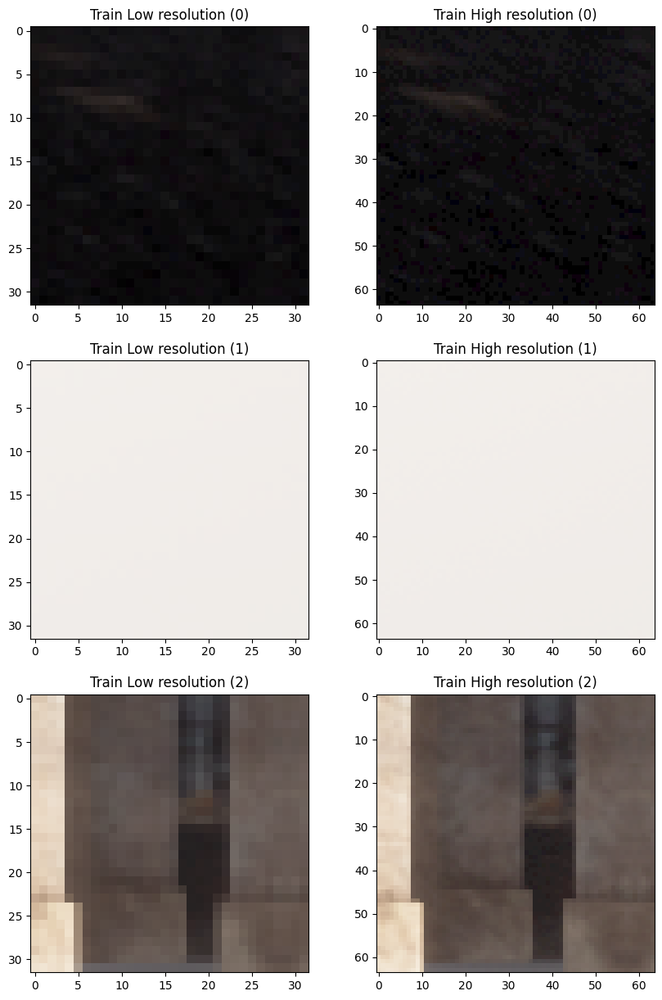

In [5]:
PlotUtils.show_dataset_example(full_train_dataset, "Train", num_images=3, width=10)

## Training a model on a small dataset 

In [6]:
small_dataset_size = 30
small_dataset = [train_dataset_patched[np.random.randint(len(train_dataset_patched))] for _ in range(small_dataset_size)]

small_train_size = int(0.8 * len(small_dataset))
small_valid_size = len(small_dataset) - small_train_size
small_train_dataset, small_valid_dataset = torch.utils.data.random_split(small_dataset, [small_train_size, small_valid_size])

print("Size of small_train_dataset:", len(small_train_dataset))

Size of small_train_dataset: 24


In [7]:
lr = 1e-4

torch.cuda.empty_cache()
r = UpscaleNN()
r = r.to(device)
# In mega bytes
print("Size of model mb", sum(p.numel() for p in r.parameters() if p.requires_grad) / (1024 * 1024))
# Size of batch in mega bytes
print("Size of batch mb", small_dataset[0][0].shape[0] * small_dataset[0][0].shape[1] * small_dataset[0][0].shape[2] * 4 / (1024 * 1024))

adam = torch.optim.Adam(r.parameters(), lr=lr)
stats_manager = SuperResolutionStatsManager()
path = "results/smallbatchexperiment-upscale"
exp = nt.Experiment(r, 
                    small_dataset, small_valid_dataset, 
                    adam, stats_manager, device, criterion, batch_size=1,
                    output_dir=path, perform_validation_during_training=True, 
                    tensor_board=False, use_lpips_loss=False)

# Show number of parameters
print("Number of parameters:", sum(p.numel() for p in r.parameters() if p.requires_grad))

Size of model mb 0.06750869750976562
Size of batch mb 0.01171875
Number of parameters: 70788


Start/Continue training from epoch 100
Finish training for 100 epochs


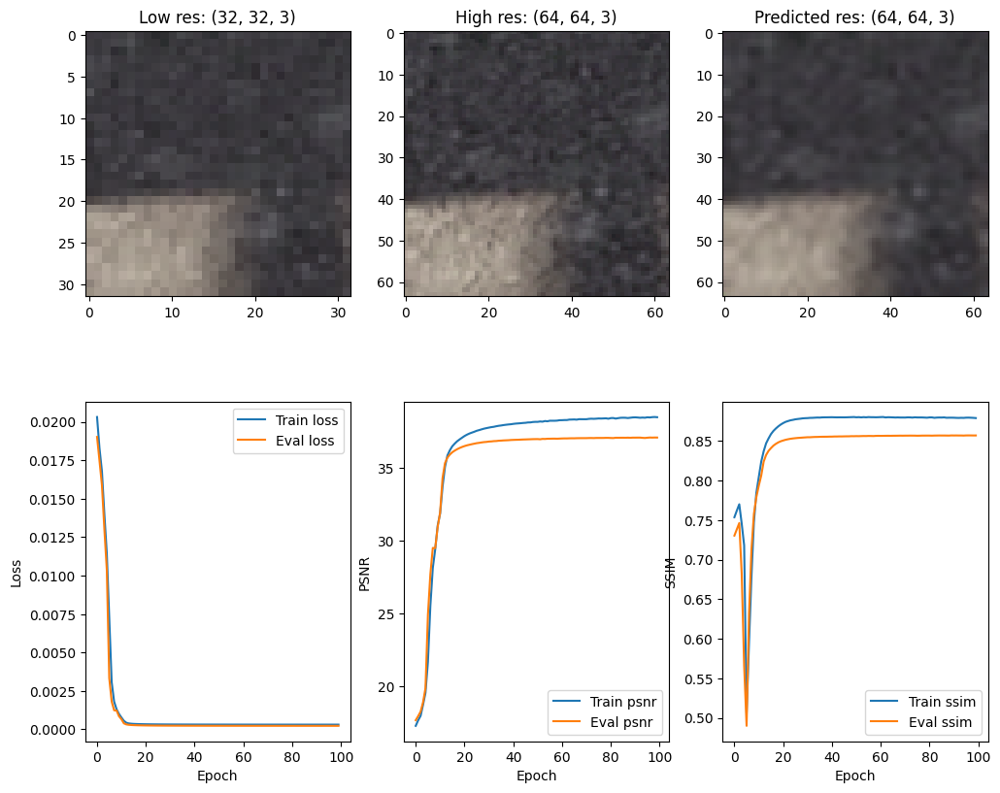

In [8]:
fig, axes = plt.subplots(ncols=3, nrows=2, figsize=(12, 10))
exp.run(num_epochs=100, 
        plot=lambda exp: PlotUtils.plot_images_and_metrics(
                        exp, axes, 
                        small_valid_dataset, np.random.randint(len(small_valid_dataset)), device))

Chosen index 0
Chosen index 1
Chosen index 2


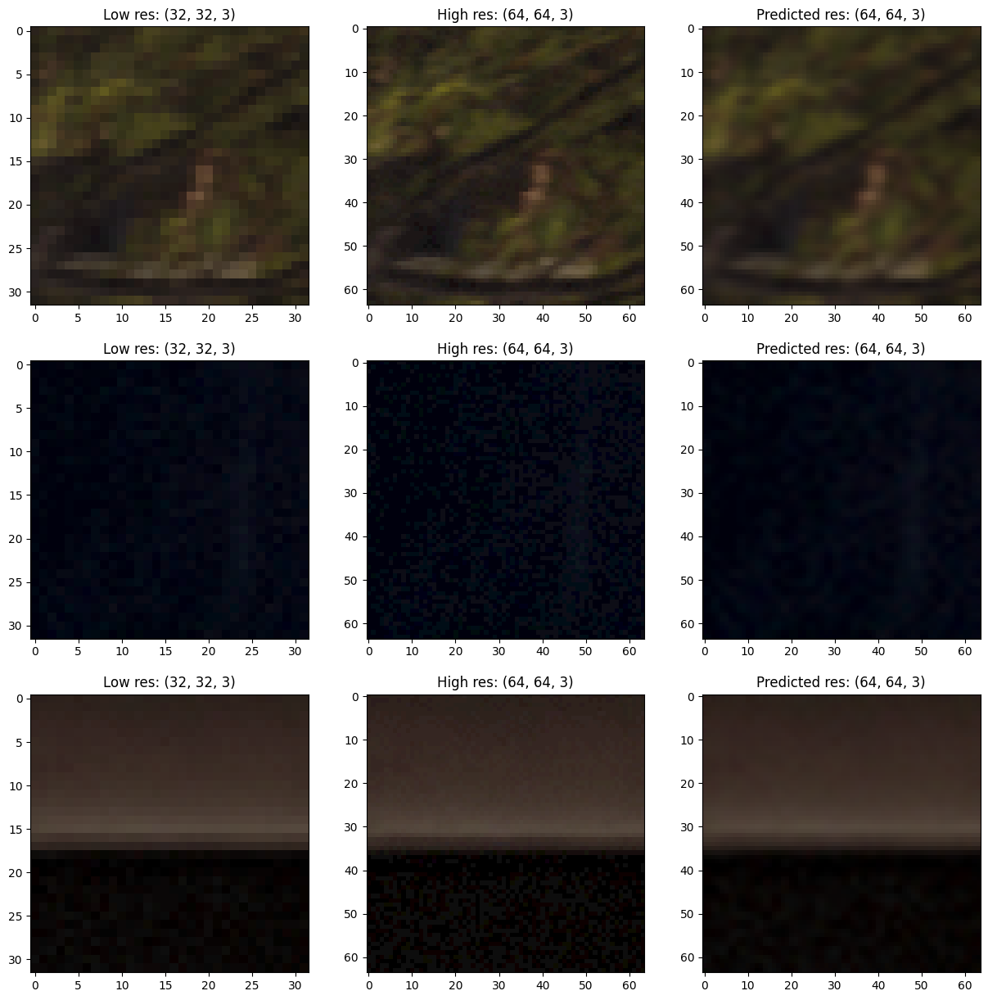

In [9]:
PlotUtils.plot_images_from_model(exp, small_dataset, device, indices=[0, 1, 2])

Chosen index 0
0.43494773 0.038854744
Chosen index 1
0.37575546 0.046824634
Chosen index 2
0.4300715 0.040002156


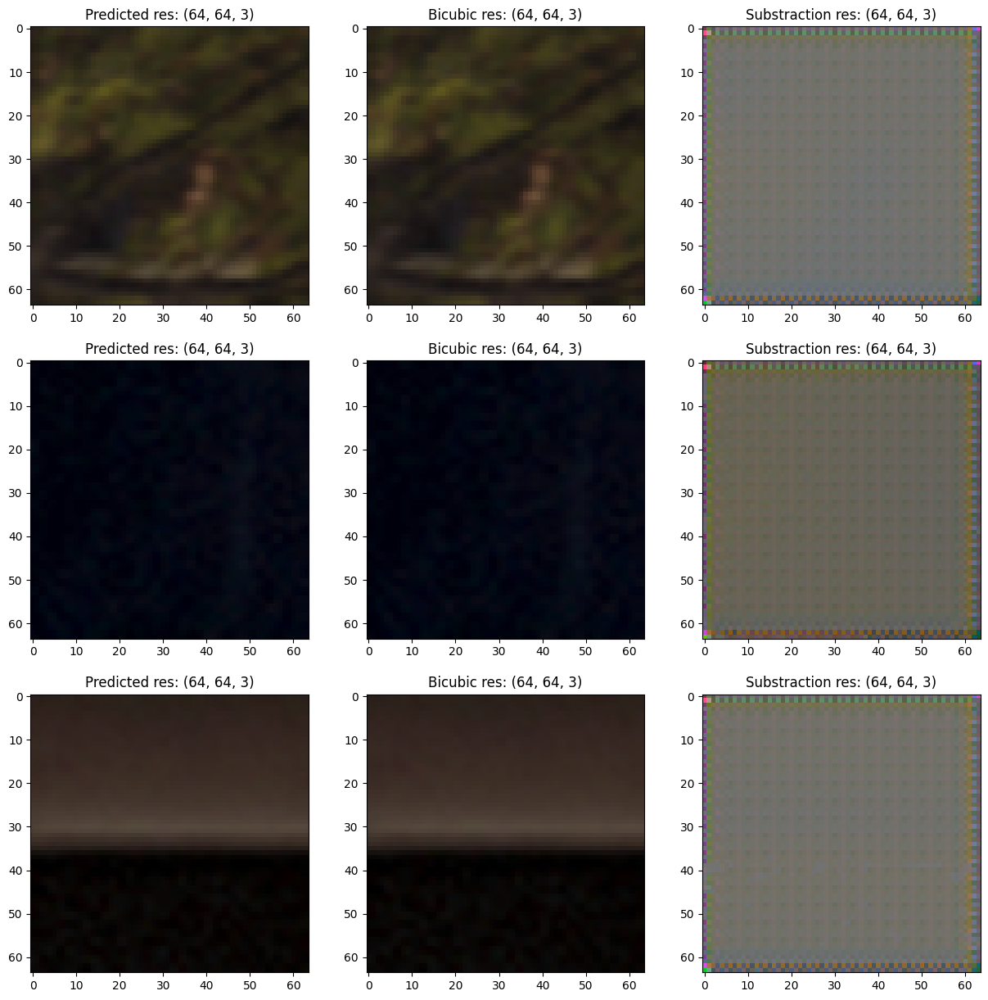

In [10]:
PlotUtils.plot_predicted_and_bicubic(exp, small_dataset, device, indices=[0, 1, 2])

# Training a model on a subsequent part of the original dataset

In [11]:

# Take the sub part of the dataset from random indices
train_size = int(0.8 * len(train_dataset_patched))
valid_size = len(train_dataset_patched) - train_size

train_sub_dataset, valid_sub_dataset = torch.utils.data.random_split(train_dataset_patched, [train_size, valid_size])

print("Size of train_dataset: ", len(train_sub_dataset))
print("Size of valid_dataset: ", len(valid_sub_dataset))

Size of train_dataset:  8000
Size of valid_dataset:  2000


In [12]:
lr = 1e-3
batch_size = 512

torch.cuda.empty_cache()
r = UpscaleNN()
r = r.to(device)

adam = torch.optim.Adam(r.parameters(), lr=lr)
stats_manager = SuperResolutionStatsManager()
path = "results/superresol-upscale2"
exp1 = nt.Experiment(r, 
                    train_sub_dataset, valid_sub_dataset, 
                    adam, stats_manager, device, criterion, 
                    batch_size=batch_size,
                    output_dir=path, perform_validation_during_training=True, 
                    tensor_board=False, use_lpips_loss=False)

Start/Continue training from epoch 50
Finish training for 20 epochs


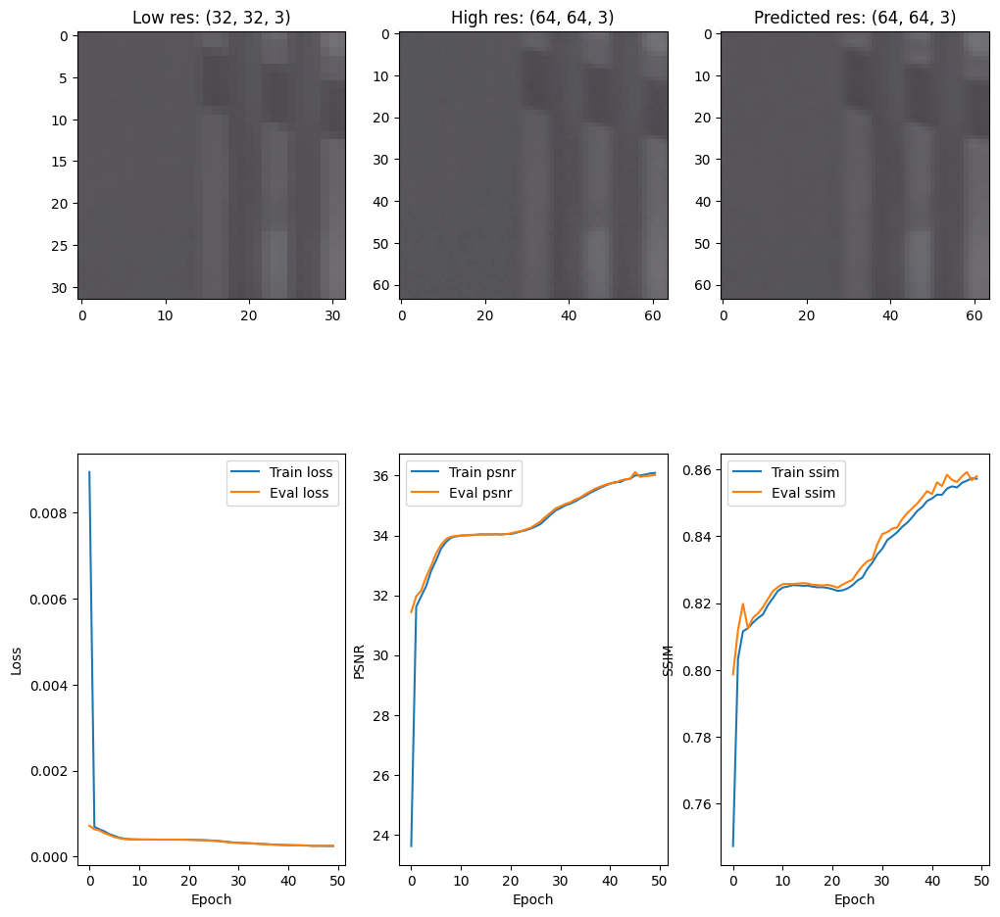

In [13]:
fig, axes = plt.subplots(ncols=3, nrows=2, figsize=(12, 12))
exp1.run(num_epochs=20, plot=lambda exp: 
         PlotUtils.plot_images_and_metrics(
             exp, axes, test_dataset_patched, np.random.randint(len(test_dataset_patched)), device))

Chosen index 0
Chosen index 1
Chosen index 2


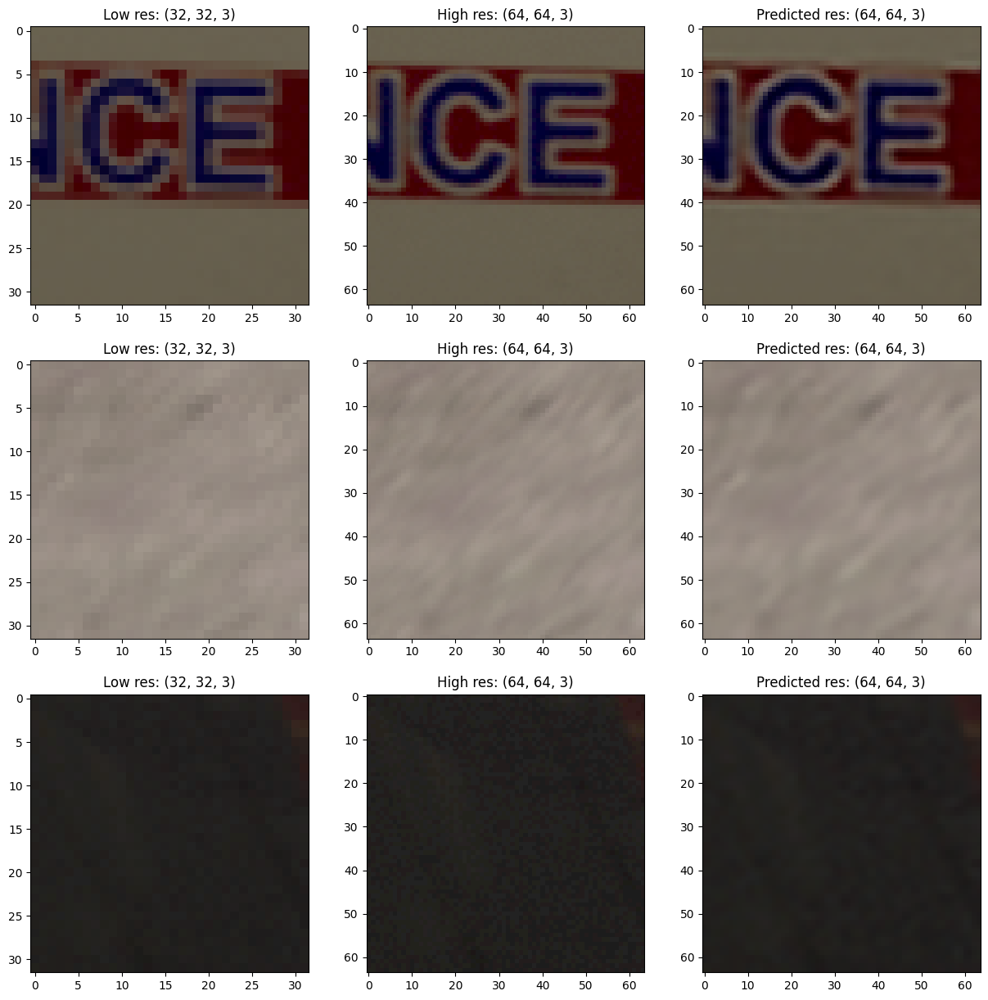

In [14]:
PlotUtils.plot_images_from_model(exp1, test_dataset_patched, device, indices=[0, 1, 2])

Chosen index 0
0.42423 0.0436173
Chosen index 1
0.41514847 0.04721982
Chosen index 2
0.4229592 0.04373967


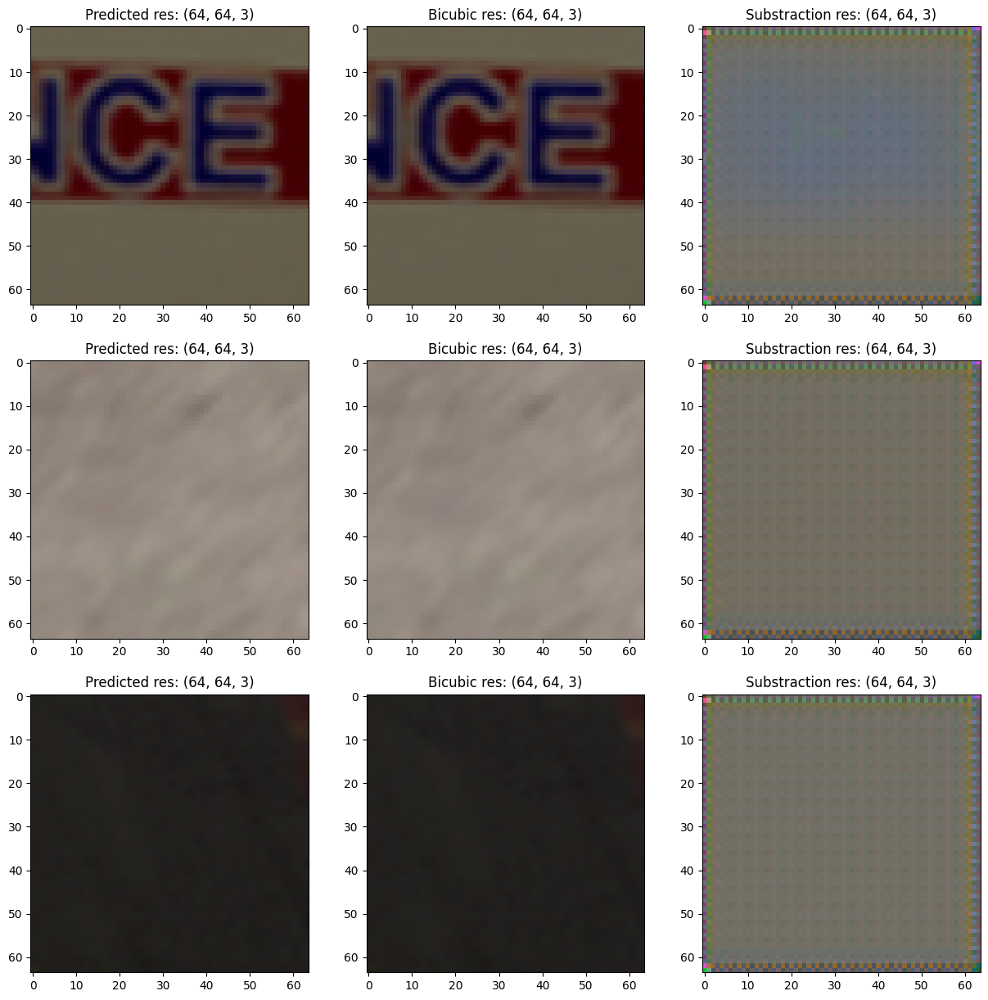

In [15]:
PlotUtils.plot_predicted_and_bicubic(exp, test_dataset_patched, device, indices=[0, 1, 2])

# Reconstruct image from patch

In [16]:
from src.PatchImageTool import PatchImageTool

index_patch_train = np.random.randint(len(full_train_dataset))
index_patch_test = np.random.randint(len(full_test_dataset))

print("Choose index train", index_patch_train, "Choose index test", index_patch_test)

start_index_patch_train = full_train_dataset.get_index_start_patch(index_patch_train)
start_index_patch_test = full_test_dataset.get_index_start_patch(index_patch_test)

print ("Start index patch train", start_index_patch_train, "Start index patch test", start_index_patch_test)

index_train = full_train_dataset.get_index_for_image(index_patch_train)
index_test = full_test_dataset.get_index_for_image(index_patch_test)

print ("Index train", index_train, "Index test", index_test)

train_low_res, train_high_res = full_train_dataset.get_full_image(index_train)
test_low_res, test_high_res = full_test_dataset.get_full_image(index_test)

high_res = full_train_dataset.high_res_size

pred_high_res1 = PatchImageTool.predict_image_from_dataset_patches(exp1, high_res, full_train_dataset, index_patch_train, device)
pred_high_res2 = PatchImageTool.predict_image_from_dataset_patches(exp1, high_res, full_test_dataset, index_patch_test, device)

Choose index train 100504 Choose index test 61192
Start index patch train 100470 Start index patch test 60690
Index train 197 Index test 119
100504 torch.Size([510, 3, 32, 32])
61192 torch.Size([510, 3, 32, 32])


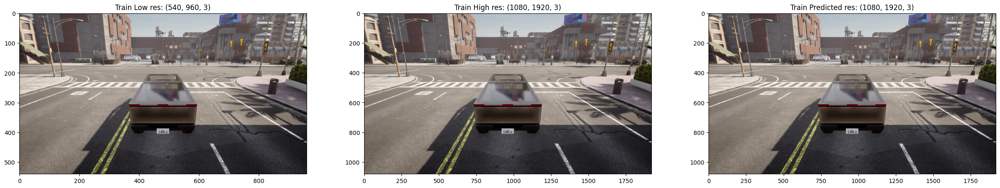

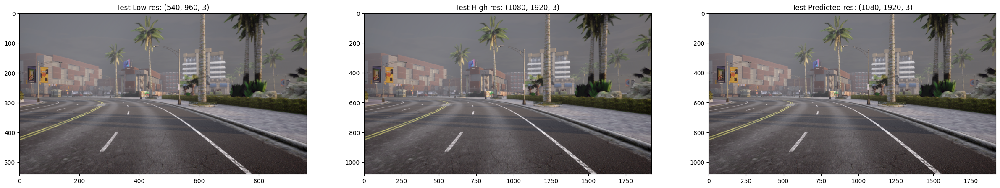

In [17]:
PlotUtils.show_low_high_predicted([train_low_res], [train_high_res], [pred_high_res1], name="Train")

PlotUtils.show_low_high_predicted([test_low_res], [test_high_res], [pred_high_res2], name="Test")

1.0 0.0
1.0 0.0


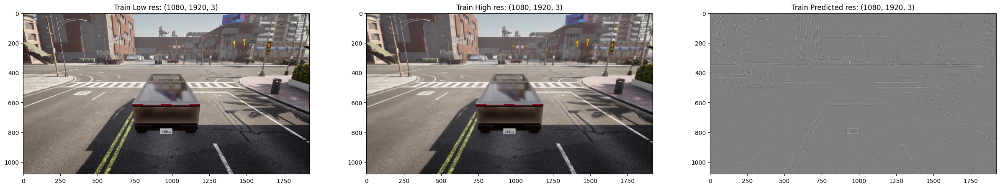

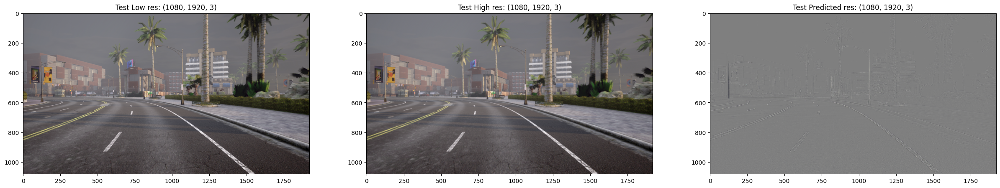

In [18]:
pred_high_res1_numpy = torchUtil.tensor_to_numpy(pred_high_res1)
bicubic_image1_numpy = torchUtil.resize_tensor_to_numpy(
    train_low_res, (pred_high_res1_numpy.shape[0], pred_high_res1_numpy.shape[1]))

subtraction_numpy = torchUtil.norm_numpy_image(pred_high_res1_numpy - bicubic_image1_numpy)

PlotUtils.show_predicted_interpolated_subtraction([pred_high_res1_numpy], [bicubic_image1_numpy], [subtraction_numpy], 
                                                  name="Train")

pred_high_res2_numpy = torchUtil.tensor_to_numpy(pred_high_res2)

bicubic_image2_numpy = torchUtil.resize_tensor_to_numpy(test_low_res, 
                                                         (pred_high_res2_numpy.shape[0], 
                                                          pred_high_res2_numpy.shape[1]))


subtraction2_numpy = torchUtil.norm_numpy_image(pred_high_res2_numpy - bicubic_image2_numpy)

PlotUtils.show_predicted_interpolated_subtraction([pred_high_res2_numpy], [bicubic_image2_numpy], [subtraction2_numpy],
                                                   name="Test")


In [19]:
# Compute the PSNR and SSIM for the predicted image

train_high_res_np = torchUtil.tensor_to_numpy(train_high_res)
test_high_res_np = torchUtil.tensor_to_numpy(test_high_res)

pred_high_res1_np = torchUtil.tensor_to_numpy(pred_high_res1)
pred_high_res2_np = torchUtil.tensor_to_numpy(pred_high_res2)

train_psnr = metrics.peak_signal_noise_ratio(train_high_res_np, pred_high_res1_np)
train_ssim = metrics.structural_similarity(train_high_res_np, pred_high_res1_np,
                                            win_size=7, data_range=1, multichannel=True, channel_axis=2)

test_psnr = metrics.peak_signal_noise_ratio(test_high_res_np, pred_high_res2_np)
test_ssim = metrics.structural_similarity(test_high_res_np, pred_high_res2_np, 
                                          win_size=7, data_range=1, multichannel=True, channel_axis=2)

print("Train PSNR", train_psnr, "Train SSIM", train_ssim)
print("Test PSNR", test_psnr, "Test SSIM", test_ssim)

# Compute the PSNR and SSIM for the bilinear image

train_bicubic_psnr = metrics.peak_signal_noise_ratio(train_high_res_np, bicubic_image1_numpy)
train_bicubic_ssim = metrics.structural_similarity(train_high_res_np, bicubic_image1_numpy, win_size=7, data_range=1, multichannel=True, channel_axis=2)

test_bicubic_psnr = metrics.peak_signal_noise_ratio(test_high_res_np, bicubic_image2_numpy)
test_bicubic_ssim = metrics.structural_similarity(test_high_res_np, bicubic_image2_numpy, win_size=7, data_range=1, multichannel=True, channel_axis=2)

print()
print("Train bilinear PSNR", train_bicubic_psnr, "Train bilinear SSIM", train_bicubic_ssim)
print("Test bilinear PSNR", test_bicubic_psnr, "Test bilinear SSIM", test_bicubic_ssim)

Train PSNR 33.06208558748271 Train SSIM 0.90989655
Test PSNR 41.142791200163806 Test SSIM 0.97732663

Train bilinear PSNR 31.886808134210874 Train bilinear SSIM 0.87627435
Test bilinear PSNR 41.48844775221954 Test bilinear SSIM 0.97705644


In [20]:
sub_dataset_size = 10

# Compute the PSNR and SSIM for the predicted image on a subset of the train set
train_psnr, train_ssim = PatchImageTool.compute_metrics_dataset(exp1, full_train_dataset, sub_dataset_size, (1920, 1080), device)

# Compute the PSNR and SSIM for the predicted image on a subset of the test set
test_psnr, test_ssim = PatchImageTool.compute_metrics_dataset(exp1, full_test_dataset, sub_dataset_size, (1920, 1080), device)

print()
print("PSNR scores for test images, mean : ", test_psnr.mean(), ", var :", test_psnr.var())
print("Average SSIM for test images, mean : ", test_ssim.mean(), ", var :", test_ssim.var())

print("Average PSNR for train images, mean : ", train_psnr.mean(), ", var :", train_psnr.var())
print("Average SSIM for train images, mean : ", train_ssim.mean(), ", var :", train_ssim.var())

246289 torch.Size([510, 3, 32, 32])
94900 torch.Size([510, 3, 32, 32])
152609 torch.Size([510, 3, 32, 32])
375312 torch.Size([510, 3, 32, 32])
370888 torch.Size([510, 3, 32, 32])
21917 torch.Size([510, 3, 32, 32])
204109 torch.Size([510, 3, 32, 32])
94350 torch.Size([510, 3, 32, 32])
5536 torch.Size([510, 3, 32, 32])
29901 torch.Size([510, 3, 32, 32])
22591 torch.Size([510, 3, 32, 32])
33318 torch.Size([510, 3, 32, 32])
54876 torch.Size([510, 3, 32, 32])
48957 torch.Size([510, 3, 32, 32])
98872 torch.Size([510, 3, 32, 32])
58264 torch.Size([510, 3, 32, 32])
76989 torch.Size([510, 3, 32, 32])
44820 torch.Size([510, 3, 32, 32])
15539 torch.Size([510, 3, 32, 32])
28545 torch.Size([510, 3, 32, 32])

PSNR scores for test images, mean :  34.77929212428169 , var : 4.540742818099494
Average SSIM for test images, mean :  0.9342658221721649 , var : 0.0010093248995525883
Average PSNR for train images, mean :  36.77543130934465 , var : 2.544750948206062
Average SSIM for train images, mean :  0.928

In [21]:
# Test on 20 images from the test set
sub_dataset_size = 20
indices = np.random.choice(len(full_test_dataset), sub_dataset_size, replace=False)
predicted_images = PatchImageTool.predict_images_from_dataset_patches(exp1, (1920, 1080), full_test_dataset, indices, device)

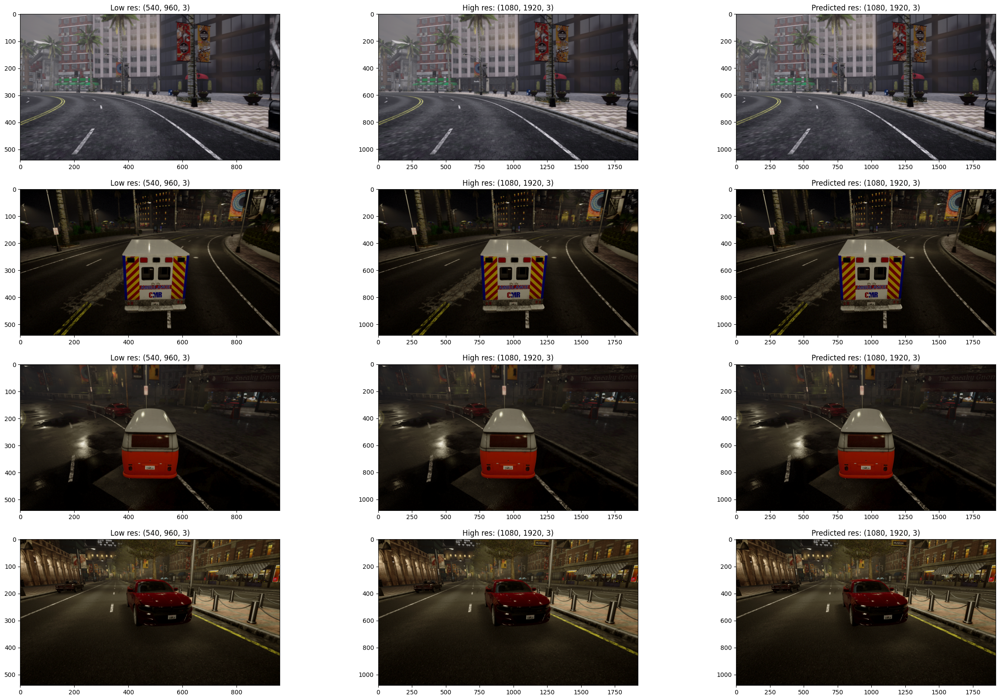

In [22]:
# Show 4 images, real vs predicted

low_res_tensor = []
high_res_tensor = []

for i in range(4):
    index = indices[i]
    image_index = full_test_dataset.get_index_for_image(index)

    low_res, high_res = full_test_dataset.get_full_image(image_index)
    low_res_tensor.append(low_res)
    high_res_tensor.append(high_res)

PlotUtils.show_low_high_predicted(low_res_tensor, high_res_tensor, predicted_images, name="Test")

torch.Size([3, 540, 960]) (1080, 1920, 3) (1080, 1920, 3) (1080, 1920)
torch.Size([3, 540, 960]) (1080, 1920, 3) (1080, 1920, 3) (1080, 1920)
torch.Size([3, 540, 960]) (1080, 1920, 3) (1080, 1920, 3) (1080, 1920)
torch.Size([3, 540, 960]) (1080, 1920, 3) (1080, 1920, 3) (1080, 1920)


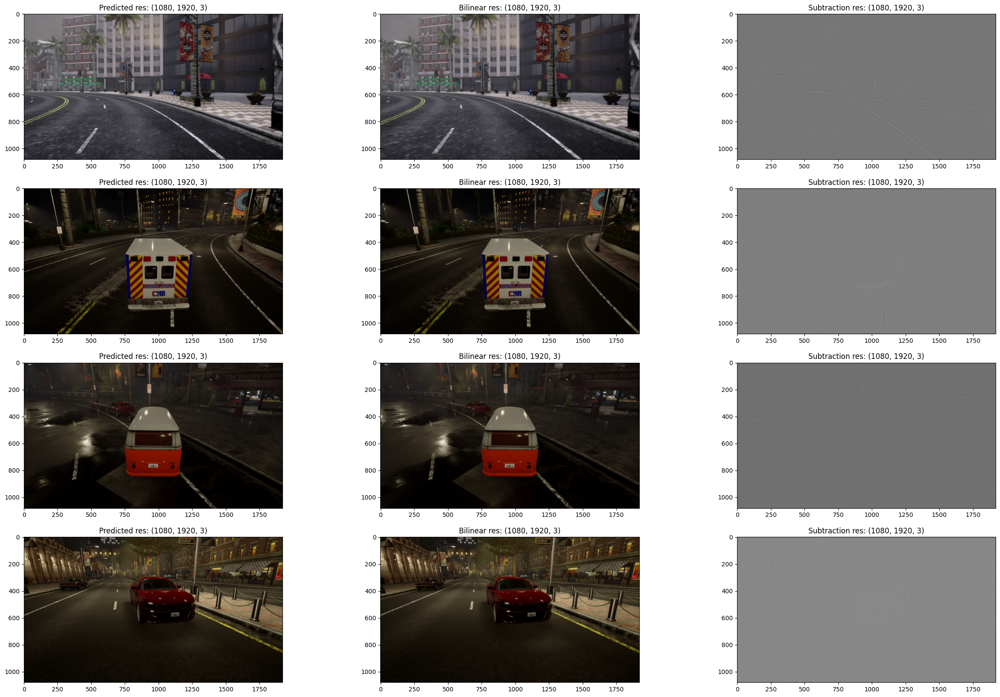

In [23]:
# Show 4 images, predicted, bilinear and subtraction

predicted_images_numpy = []
bicubic_images_numpy = []
subtraction_images_numpy = []

for i in range(4):
    index = indices[i]
    image_index = full_test_dataset.get_index_for_image(index)

    low_res, high_res = full_test_dataset.get_full_image(image_index)

    pred_high_res_image = torchUtil.tensor_to_numpy(predicted_images[i])
    bicubic_image = torchUtil.resize_tensor_to_numpy(low_res, (pred_high_res_image.shape[0], pred_high_res_image.shape[1]))

    predicted_images_numpy.append(pred_high_res_image)
    bicubic_images_numpy.append(bicubic_image)
    
    subtraction_image = torchUtil.norm_numpy_image(pred_high_res_image - bicubic_image)
    subtraction_images_numpy.append(subtraction_image)

PlotUtils.show_predicted_interpolated_subtraction(predicted_images_numpy, bicubic_images_numpy, subtraction_images_numpy, 
                                                  name="Test")

In [24]:
# compute the mean and var psnr and ssim for n images from the test set

batch_size = full_test_dataset.get_number_patch_per_image() * 4

sub_size = 1
sub_dataset_size = int(sub_size * len(full_test_dataset) / full_test_dataset.get_number_patch_per_image())
print("Number of images in full data set part", sub_dataset_size)
test_psnr, test_ssim = PatchImageTool.compute_metrics_dataset_batched(exp1, (1920, 1080), full_test_dataset, sub_dataset_size, device, batch_size)

# Compute the PSNR and SSIM for the bilinear image on a subset of the train set

test_bicubic_psnr, test_bicubic_ssim = [], []

for i in range(sub_dataset_size):
    low_res, high_res = full_test_dataset.get_full_image(i)

    low_res_image = torchUtil.tensor_to_numpy(low_res)
    high_res_image = torchUtil.tensor_to_numpy(high_res)

    bicubic_image = torchUtil.resize_tensor_to_numpy(low_res, (high_res_image.shape[0], high_res_image.shape[1]))

    test_bicubic_psnr.append(metrics.peak_signal_noise_ratio(high_res_image, bicubic_image))
    test_bicubic_ssim.append(metrics.structural_similarity(high_res_image, bicubic_image, win_size=7, data_range=1, multichannel=True, channel_axis=2))

# compute the mean and var psnr and ssim for 100 images from the train set

sub_dataset_size = int(sub_size * len(full_train_dataset) / full_train_dataset.get_number_patch_per_image())
print("Number of images in full data set part", sub_dataset_size)
train_psnr, train_ssim = PatchImageTool.compute_metrics_dataset_batched(exp1,  (1920, 1080), full_train_dataset, sub_dataset_size, device, batch_size)

train_bicubic_psnr, train_bicubic_ssim = [], []

for i in range(sub_dataset_size):
    low_res, high_res = full_train_dataset.get_full_image(i)

    low_res_image = torchUtil.tensor_to_numpy(low_res)
    high_res_image = torchUtil.tensor_to_numpy(high_res)

    bicubic_image = torchUtil.resize_tensor_to_numpy(low_res, (high_res_image.shape[0], high_res_image.shape[1]))

    train_bicubic_psnr.append(metrics.peak_signal_noise_ratio(high_res_image, bicubic_image))
    train_bicubic_ssim.append(metrics.structural_similarity(high_res_image, bicubic_image, win_size=7, data_range=1, multichannel=True, channel_axis=2))

print("Average PSNR for test images", test_psnr.mean(), "Variance", test_psnr.var())
print("Average SSIM for test images", test_ssim.mean(), "Variance", test_ssim.var())

print("Average PSNR for bicubic test images", np.array(test_bicubic_psnr).mean(), "Variance", np.array(test_bicubic_psnr).var())
print("Average SSIM for bicubic test images", np.array(test_bicubic_ssim).mean(), "Variance", np.array(test_bicubic_ssim).var())

print()

print("Average PSNR for train images", train_psnr.mean(), "Variance", train_psnr.var())
print("Average SSIM for train images", train_ssim.mean(), "Variance", train_ssim.var())

print("Average PSNR for bicubic train images", np.array(train_bicubic_psnr).mean(), "Variance", np.array(train_bicubic_psnr).var())
print("Average SSIM for bicubic train images", np.array(train_bicubic_ssim).mean(), "Variance", np.array(train_bicubic_ssim).var())


Number of images in full data set part 200
Number of images in full data set part 800
Average PSNR for test images 36.46919269244274 Variance 6.435666266877875
Average SSIM for test images 0.9354985594749451 Variance 0.0013746111846422338
Average PSNR for bilinear test images 36.54951027068537 Variance 6.842122138305457
Average SSIM for bilinear test images 0.93320966 Variance 0.0014858032

Average PSNR for train images 36.27661311960916 Variance 6.826140240904774
Average SSIM for train images 0.9361906373500823 Variance 0.0013676741964721228
Average PSNR for bilinear train images 36.37691603422825 Variance 7.174083975267884
Average SSIM for bilinear train images 0.9337196 Variance 0.0015063004
